In [5]:
using Gnuplot
function figsize(x=300,y=300)
    Gnuplot.options.mime[MIME"text/html"] = 
    "svg enhanced standalone mouse size $x,$y";
end

figsize (generic function with 3 methods)

In [2]:
x = y = collect(1:10)

10-element Array{Int64,1}:
  1
  2
  3
  4
  5
  6
  7
  8
  9
 10

In [3]:
function gp_theme(bgcolor = "#212946"; borderc ="white",
        ticsc = "white", ylabc = "white", gridst = 4,
        xlabc = "white", gridc = "#2A3459", labc = "white")
    bgcp1 = "set object rectangle from screen 0,0 to screen 1,1"
    bgcp2 = " behind fc '$(bgcolor)' fs solid noborder"
    bgcolor = bgcp1*bgcp2
    @gp :- "set border lw 1 lc '$(borderc)'"
    @gp :- "set tics textcolor rgb '$(ticsc)'"
    @gp :- bgcolor
    @gp :- "set ylabel 'y' textcolor '$(ylabc)'"
    @gp :- "set xlabel 'x' textcolor '$(xlabc)'"
    @gp :- "set grid ls 1 lc '$(gridc)' dt $(gridst)"
    @gp :- "set key t r textcolor '$(labc)'"
end

gp_theme (generic function with 2 methods)

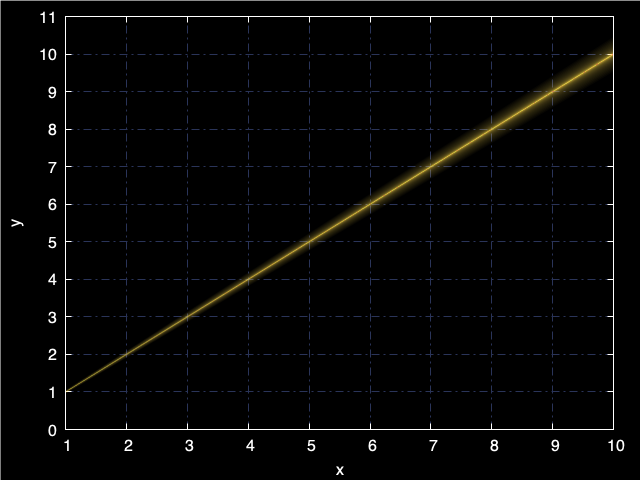

In [4]:
figsize()
α2 = 1.5
αinc = 0.3
nlines = 200
iniw = 20
@gp x y .+ y/nlines y .- y/nlines "w filledcu not lc '#F5FFE64D'" :-
for i in 1:nlines
    @gp :- x y .+ y/(iniw+α2*i) y .- y/(iniw+α2*i) "w filledcu not lc '#F5FFE64D'" :-
    α2 += αinc
end
gp_theme("black")
@gp

In [5]:
function raylines(x,y; color="#F5FFE64D", α2 = 1.5, αinc = 0.3, nlines = 200, iniw = 20)
    @gp x y .+ y/nlines y .- y/nlines "w filledcu not lc '$(color)'" :-
    for i in 1:nlines
        @gp :- x y .+ sqrt.(x.^2 .+ y.^2)/(iniw+α2*i) y .- sqrt.(x.^2 .+ y.^2)/(iniw+α2*i) "w filledcu not lc '$(color)'" :-
        α2 += αinc
    end
    for i in 1:nlines
        @gp :- [x[end]] [y[end]] "w points not lc '$(color)' pt 7 ps $(i/(nlines/2.5))" :-
    end
    @gp
end

raylines (generic function with 1 method)

In [6]:
x = y = collect(1:10);

In [7]:
raylines3(x,x.^1.5; color = "#F508F7FE")
gp_theme("black")

UndefVarError: UndefVarError: raylines3 not defined

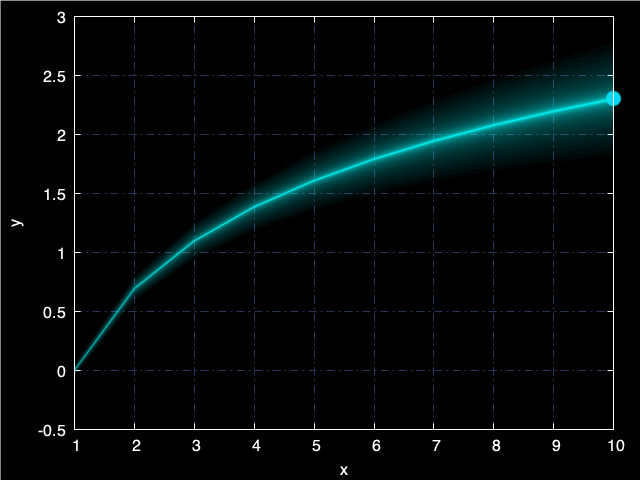

In [8]:
raylines(x, log.(y); color = "#F508F7FE")
gp_theme("black")

In [9]:
x = 0:0.1:4π

0.0:0.1:12.5

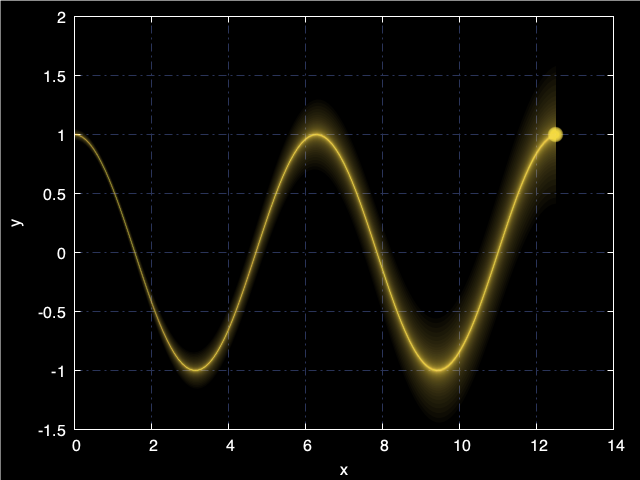

In [10]:
raylines(x, cos.(x); color = "#F5FFE64D", nlines = 100)
gp_theme("black")

In [11]:
a = 1.5
b = -2.4
t = LinRange(0,5*π,500)
x = (a .+ b*t) .* cos.(t)
y = (a .+ b*t) .* sin.(t);

In [12]:
function raylines2(x,y; color="#F5FFE64D", α2 = 1.5, αinc = 0.3, nlines = 200, iniw = 20)
    @gp x y .+ y/nlines y .- y/nlines "w filledcu not lc '$(color)'" :-
    for i in 1:nlines
        @gp :- x .+ x/(iniw+α2*i) y .+ y/(iniw+α2*i) y .- y/(iniw+α2*i) "w filledcu not lc '$(color)'" :-
        α2 += αinc
    end
    for i in 1:nlines
        @gp :- [x[end]] [y[end]] "w points not lc '$(color)' pt 7 ps $(i/(nlines/2.5))" :-
    end
    @gp
end

raylines2 (generic function with 1 method)

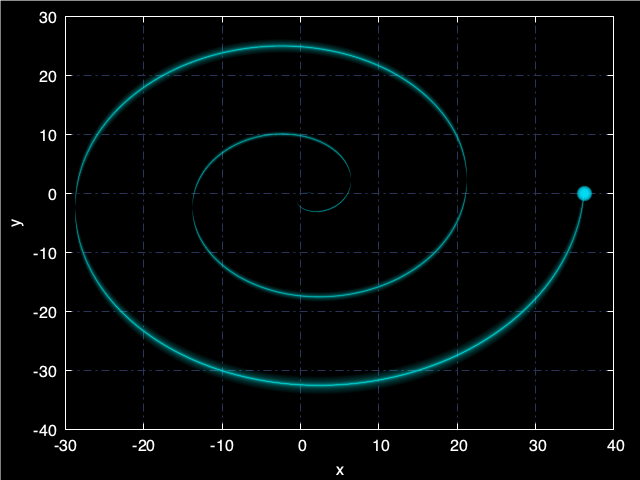

In [13]:
figsize(400,400)
raylines(x,y; color = "#F508F7FE", nlines = 100)
gp_theme("black")

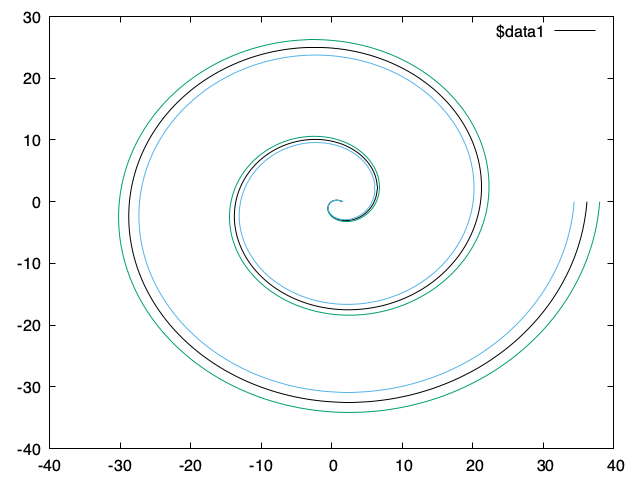

In [14]:
@gp x y "w l lc 'black'" :-
@gp :- x .+ 0.05x y .+ 0.05y "w l not" :-
@gp :- x .- 0.05x y .- 0.05y "w l not"

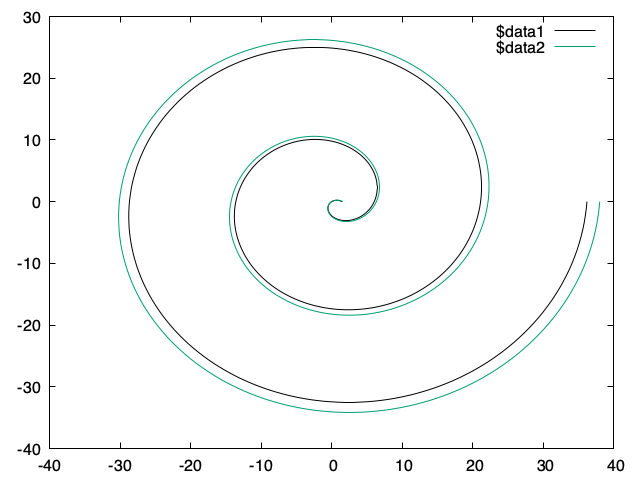

In [15]:
@gp x y "w l lc 'black'" :-
@gp :- x .+ 0.05x y .+ 0.05y "w l" 
#@gp :- x .- 0.05x y .- 0.05y "w l not"

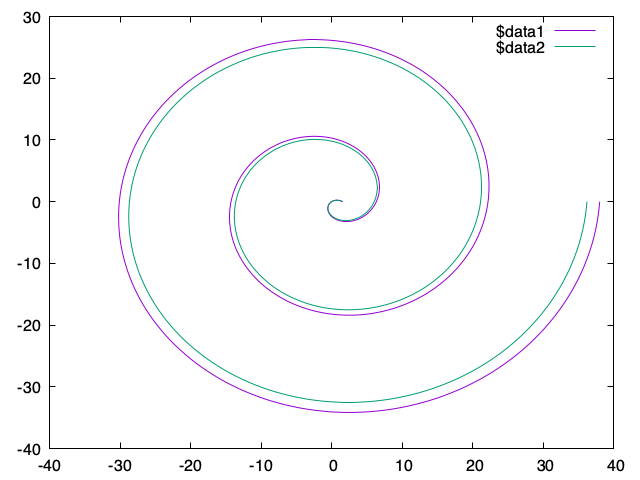

In [16]:
@gp x .+ 0.05x  y .+ 0.05y "w l" :-
@gp :- reverse(x) reverse(y) "w l"

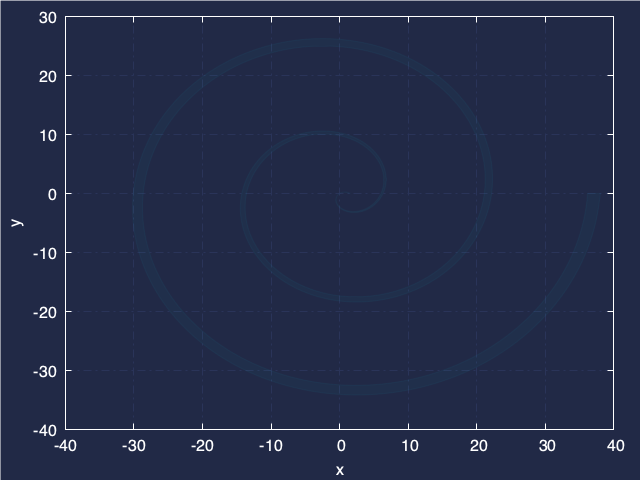

In [17]:
@gp vcat(x .+ 0.05x, reverse(x))  vcat(y .+ 0.05y, reverse(y)) "w filledcu lc '#F508F7FE' not"
gp_theme()

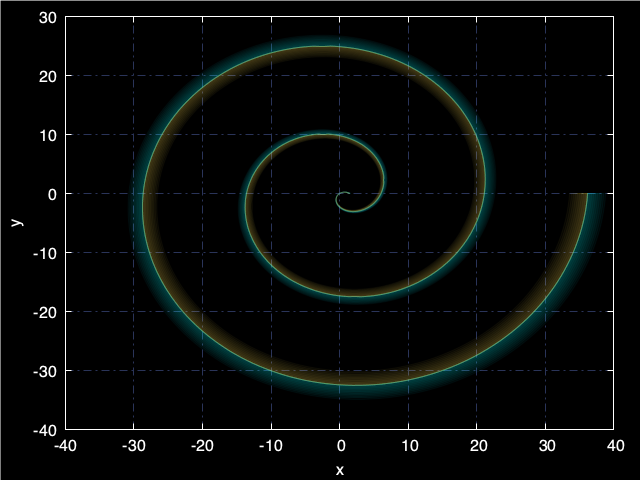

In [18]:
@gp xlab = "x" ylab = "y" :- 
for α in 0.001: 0.008:0.08
    xnew1 = vcat(x .+ α*x, reverse(x))
    ynew1 = vcat(y .+ α*y, reverse(y))
    xnew2 = vcat(x .- α*x, reverse(x))
    ynew2 = vcat(y .- α*y, reverse(y))
    @gp :- xnew1 ynew1   "w filledcu lc '#F508F7FE' not" :-
    @gp :- xnew2 ynew2   "w filledcu lc '#F5FFE64D' not" :-
end

gp_theme("black")

In [19]:
a = 1.5
b = -2.4
t = LinRange(0,7.2*π,500)
x = (a .+ b*t) .* cos.(t)
y = (a .+ b*t) .* sin.(t);

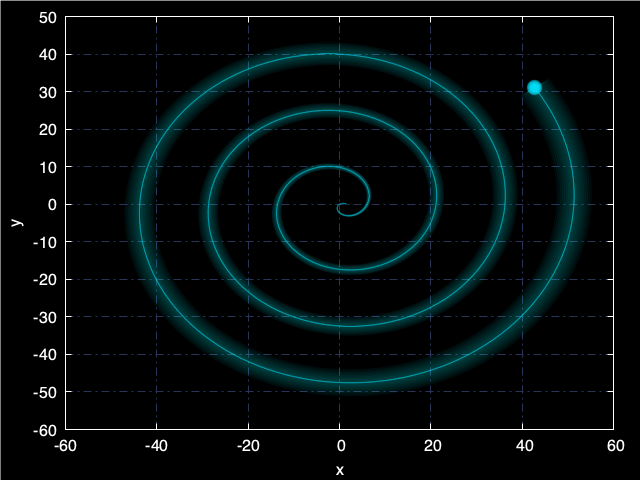

In [20]:
@gp xlab = "x" ylab = "y" :- 
xr, yr = reverse(x), reverse(y)
for (i,α) in enumerate(0.001: 0.008:0.08)
    fx, fy = α*x, α*y
    xnew1, ynew1 = vcat(x .+ fx, xr), vcat(y .+ fy, yr)
    xnew2, ynew2 = vcat(x .- fx, xr), vcat(y .- fy, yr)
    @gp :- xnew1 ynew1 "w filledcu lc '#F508F7FE' not" :-
    @gp :- xnew2 ynew2 "w filledcu lc '#F508F7FE' not" :-
end
nlines=100
for i in 1:nlines
    @gp :- [x[end]] [y[end]] "w points not lc '#F508F7FE' pt 7 ps $(i/(nlines/2.5))" :-
end
gp_theme("black")
#@gp

In [21]:
function raylines3(x,y; color="#F5FFE64D", αi = 0.001,
        αinc = 0.008, αmax = 0.08, mfs = 2.5, nlines = 100)
    @gp xlab = "x" ylab = "y" :- 
    xr, yr = reverse(x), reverse(y)
    for (i,α) in enumerate(αi:αinc:αmax)
        fx, fy = α*x, α*y
        xnew1, ynew1 = vcat(x .+ fx, xr), vcat(y .+ fy, yr)
        xnew2, ynew2 = vcat(x .- fx, xr), vcat(y .- fy, yr)
        @gp :- xnew1 ynew1 "w filledcu lc '$(color)' not" :-
        @gp :- xnew2 ynew2 "w filledcu lc '$(color)' not" :-
    end
    for i in 1:nlines
        @gp :- [x[end]] [y[end]] "w points not lc '$(color)' pt 7 ps $(i/(nlines/mfs))" :-
    end
    gp_theme("black") 
end

raylines3 (generic function with 1 method)

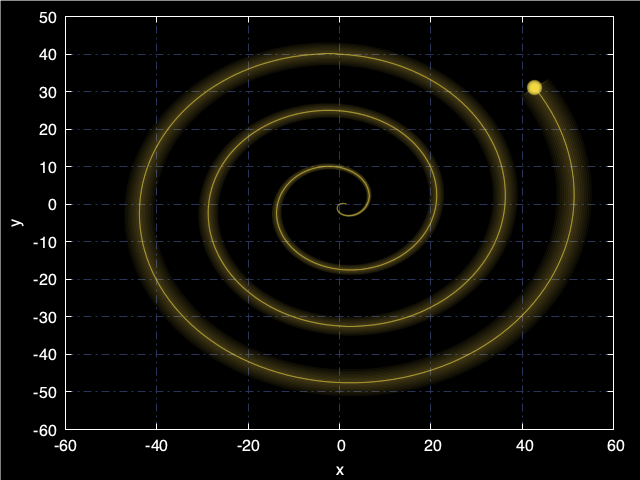

In [22]:
raylines3(x,y)

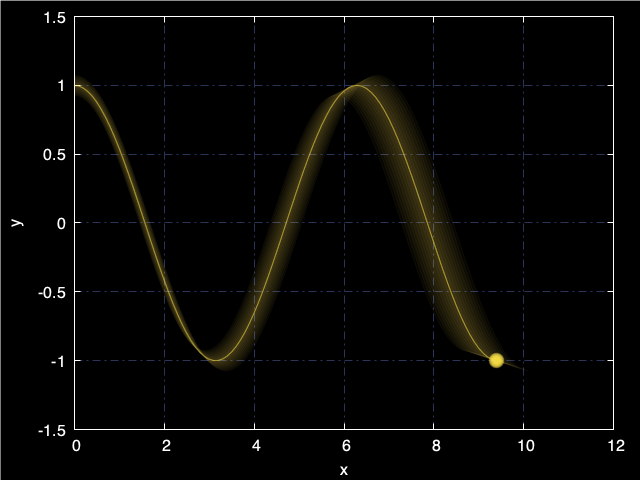

In [23]:
x = 0:0.1:3π
raylines3(x, cos.(x))

In [24]:
n = 150
t = range(0, 2π, length = n)
x = sin.(t)
y = cos.(t);

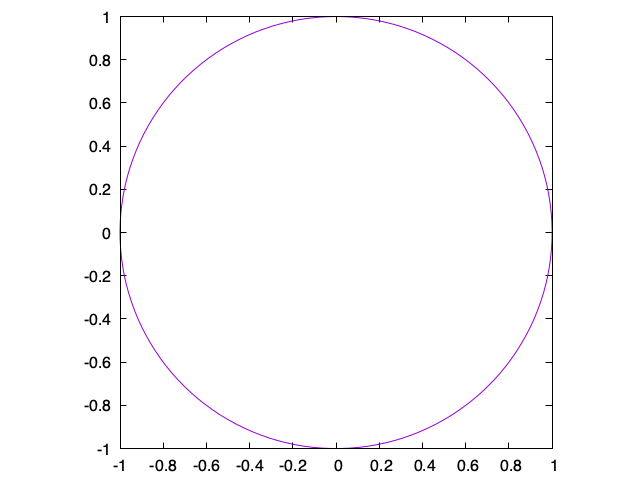

In [25]:
@gp x y "w l not" "set size square" 

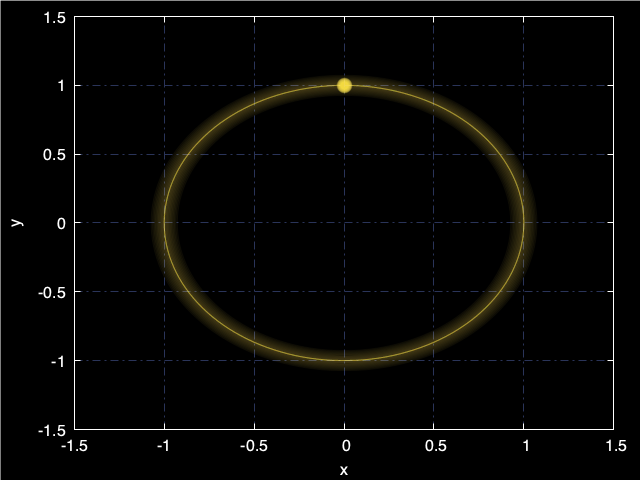

In [26]:
raylines3(x, y)

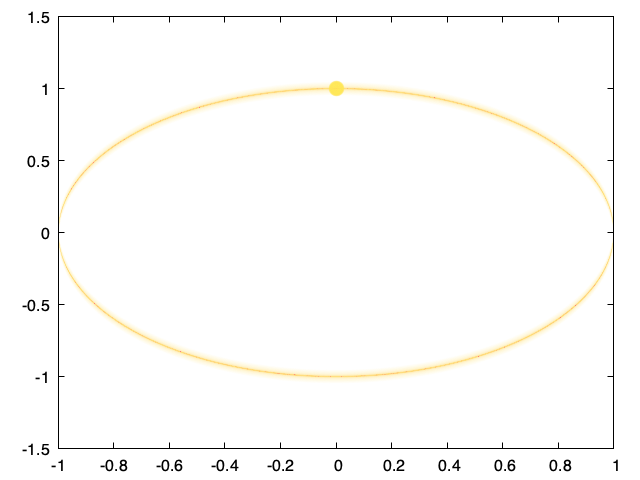

In [27]:
raylines(x, y)

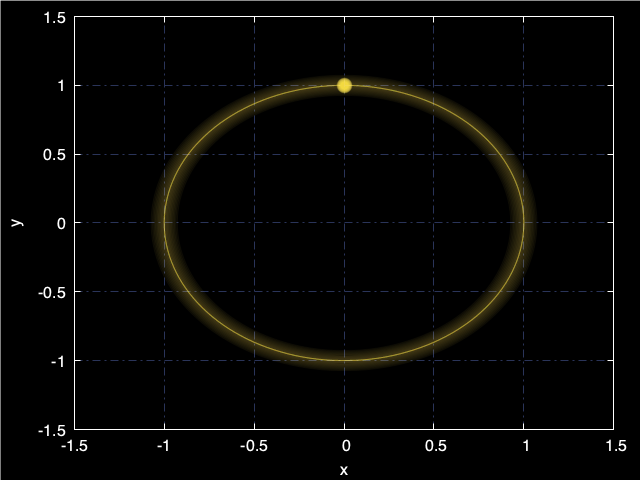

In [28]:
raylines3(x, y)

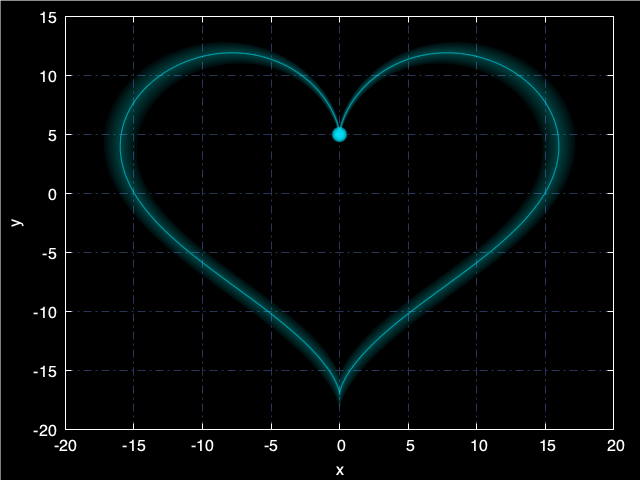

In [29]:
n = 400
t = range(0, 2π, length = n)
x = 16sin.(t).^3
y = 13cos.(t) .- 5cos.(2t) .- 2cos.(3t) .- cos.(4t)
raylines3(x, y; color = "#F508F7FE")

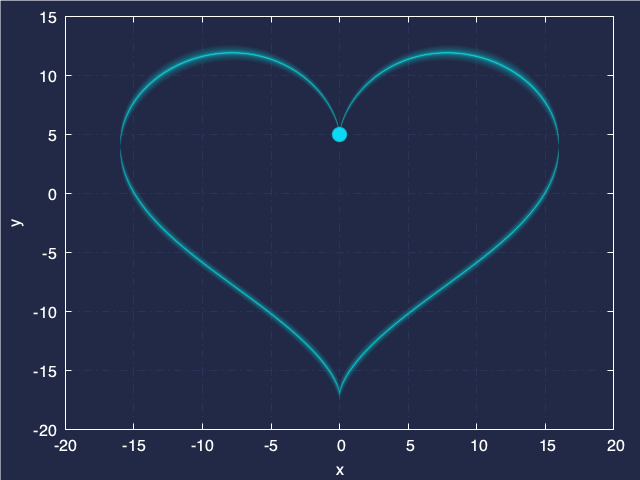

In [30]:
raylines(x, y; color = "#F508F7FE")
gp_theme()

In [31]:
xsize  =LinRange(0.25, 1, 400)

400-element LinRange{Float64}:
 0.25,0.25188,0.253759,0.255639,0.257519,…,0.994361,0.996241,0.99812,1.0

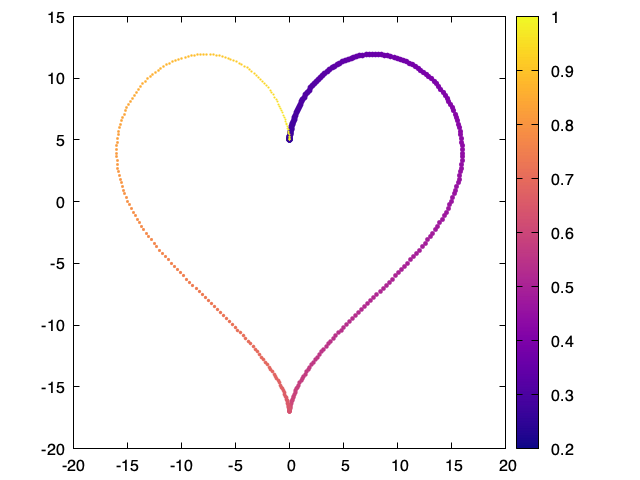

In [32]:
@gp x y reverse(xsize) xsize "w p not lw 0.1 pt 7 ps var lc palette" :-
@gp :- palette(:plasma) "set size square" 
#@gp :- "set style line 1 lc rgb 'black' lt 1 lw 1 pt 6 pi -200 ps 1.5"

In [ ]:
@gp xlab = "x" ylab = "y"
@gp :- "i=2"
@gp :- x y z tempo "every ::1::i w l notit lc palette" :-
for frame in 2:40:length(x)
  @gp :- frame "i=$frame" "replot" :-
end

In [33]:
160/60

2.6666666666666665

In [37]:
for i in 1:1000
    print(i, "\r")
end

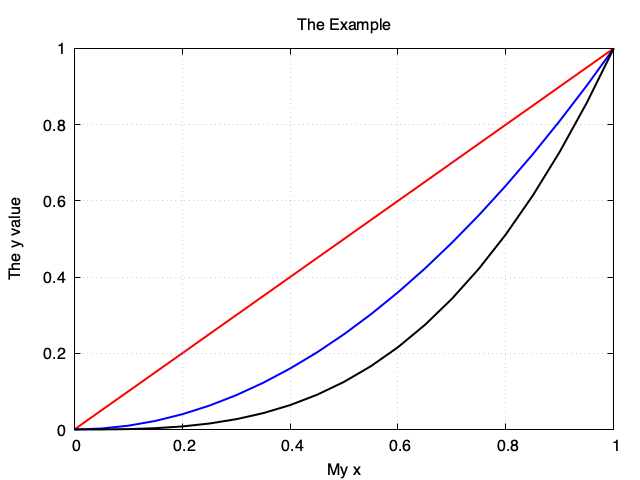

In [61]:
# Define an explicit recipe for this particular problem
function multiY(x::AbstractVector{Float64}, Y::AbstractMatrix{Float64}; st = :p,
        labels= [], leg=:t, linec = [])
    out = Vector{Gnuplot.PlotElement}()
    sY = size(Y)[2]
    labels = length(labels) !== 0 ? labels : ["y$(i)" for i ∈ 1:sY]
    linec = length(linec) !== 0 ? ["lc '$(string(c))'" for c ∈ linec] : [" " for i in 1:sY]
    for i in 1:sY
        plotspec = "w $(string(st)) lw 2 ps 2 $(linec[i]) $(string(leg)) '$(labels[i])'"
        push!(out, Gnuplot.PlotElement(data=Gnuplot.Dataset([x, Y[:, i]]), plot=plotspec))
    end
    return out
end

x = 0:0.05:2
y = x.^(1:3)'
figsize(400,300)
@gp "set grid" tit="The Example" xlab="My x" ylab="The y value" xr=[0,1]
@gp :- multiY(x, y, st = :l, leg =:not, linec = [:red,:blue,:black])

In [43]:
linec = []

0-element Array{Any,1}

In [45]:
length(linec)

0

In [14]:
lc = [" " for i in 1:4]

4-element Array{String,1}:
 " "
 " "
 " "
 " "

In [22]:
linec = [:red, :blue, :yellow]

3-element Array{Symbol,1}:
 :red
 :blue
 :yellow

In [62]:
32*81

2592